# 10x RNA-seq gene expression data (part 2b)

We can continue to explore our examples looking at the expression of canonical neurotransmitter transporter genes and gene Tac2 over the whole brain. 

You need to be connected to the internet to run this notebook and that you have downloaded the example data via the getting started notebook.

In [736]:
import os
import pandas as pd
import numpy as np
import anndata
import time
import json
import matplotlib.pyplot as plt
import requests
import seaborn as sns
import matplotlib.patches as mpatches
from tqdm.notebook import tqdm
import matplotlib.colors as plt_colors
from allensdk.core.reference_space_cache import ReferenceSpaceCache
from pathlib import Path
import matplotlib.gridspec as gridspec
from Utils.Settings import output_folder_calculations, output_folder_figures_calculations

The prerequisite for running this notebook is that the data have been downloaded to local directory maintaining the organization from the manifest.json. **Change the download_base variable to where you have downloaded the data in your system.**

In [210]:
version = '20230830'
download_base =  '/alzheimer/Roberto/Allen_Institute/abc_download_root'

manifest_path = 'releases/%s/manifest.json' % version

url = 'https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/' + manifest_path
manifest = json.loads(requests.get(url).text)

metadata = manifest['file_listing']['WMB-10X']['metadata']

In [211]:
view_directory = os.path.join( download_base, 
                               manifest['directory_listing']['WMB-10X']['directories']['metadata']['relative_path'], 
                              'views')
cache_views = False
if cache_views :
    os.makedirs( view_directory, exist_ok=True )

Read in the expanded cell metadata table we created in part 1.

In [212]:
rpath = metadata['cell_metadata_with_cluster_annotation']['files']['csv']['relative_path']
file = os.path.join( download_base, rpath )
cell = pd.read_csv(file, keep_default_na=False)
cell.set_index('cell_label',inplace=True)

In [213]:
matrices = cell.groupby(['dataset_label','feature_matrix_label'])[['library_label']].count()
matrices.columns  = ['cell_count']


In [214]:
file

'/alzheimer/Roberto/Allen_Institute/abc_download_root/metadata/WMB-10X/20230830/views/cell_metadata_with_cluster_annotation.csv'

In [215]:
rpath = metadata['example_genes_all_cells_expression']['files']['csv']['relative_path']
file = os.path.join( download_base, rpath)
exp = pd.read_csv(file)
exp.set_index('cell_label',inplace=True)
exp  = exp.sort_index(axis=1)


# Process

In [500]:
class_to_division = {'01 IT-ET Glut': "CTX Glut",
'02 NP-CT-L6b Glut': "CTX Glut",
'03 OB-CR Glut':"CTX Glut",
'04 DG-IMN Glut':"CTX Glut",
'05 OB-IMN GABA':"CTX Gaba", 
'06 CTX-CGE GABA': "CTX Gaba",
'07 CTX-MGE GABA': "CTX Gaba", 
'08 CNU-MGE GABA': "CNU Gaba", 
'09 CNU-LGE GABA': "CNU Gaba", 
'10 LSX GABA': "CNU Gaba",  
'11 CNU-HYa GABA': "CNU Gaba",  
'12 HY GABA': "HY Gaba",  
'13 CNU-HYa Glut': "HY Glut",
'14 HY Glut': "HY Glut", 
'15 HY Gnrh1 Glut': "HY Glut", 
'16 HY MM Glut': "HY Glut",
'17 MH-LH Glut': "TH Glut",
'18 TH Glut': "TH Glut", 
'19 MB Glut': "MB Glut", 
'20 MB GABA': "MB Gaba",
'21 MB Dopa': "MB Dopa",
'22 MB-HB Sero': "MB Sero", 
'23 P Glut': "HB Glut",  
'24 MY Glut': "HB Glut", 
'25 Pineal Glut': "TH Glut", 
'26 P GABA': "HB Gaba", 
'27 MY GABA': "HB Gaba",  
'28 CB GABA': "CB Gaba", 
'29 CB Glut': "CB Glut", 
'30 Astro-Epen': "Non-neuronal", 
'31 OPC-Oligo': "Non-neuronal", 
'32 OEC': "Non-neuronal", 
'33 Vascular': "Non-neuronal", 
'34 Immune': "Non-neuronal"}

In [640]:
order_division = ["CTX Glut", "CTX Gaba", "CNU Gaba","HY Glut","HY Gaba","TH Glut","MB Glut", "MB Gaba","MB Dopa","MB Sero", "HB Glut", "HB Gaba", "CB Glut",  "CB Gaba","Non-neuronal"]

In [644]:
class_to_broad_division = {
    '01 IT-ET Glut': "CTX",
    '02 NP-CT-L6b Glut': "CTX",
    '03 OB-CR Glut': "CTX",
    '04 DG-IMN Glut': "CTX",
    '05 OB-IMN GABA': "CTX", 
    '06 CTX-CGE GABA': "CTX",
    '07 CTX-MGE GABA': "CTX", 
    '08 CNU-MGE GABA': "CNU", 
    '09 CNU-LGE GABA': "CNU", 
    '10 LSX GABA': "CNU",  
    '11 CNU-HYa GABA': "CNU",  
    '12 HY GABA': "IB",  
    '13 CNU-HYa Glut': "IB",
    '14 HY Glut': "IB", 
    '15 HY Gnrh1 Glut': "IB", 
    '16 HY MM Glut': "IB",
    '17 MH-LH Glut': "IB",
    '18 TH Glut': "IB", 
    '19 MB Glut': "MB", 
    '20 MB GABA': "MB",
    '21 MB Dopa': "MB",
    '22 MB-HB Sero': "MB", 
    '23 P Glut': "HB",  
    '24 MY Glut': "HB", 
    '25 Pineal Glut': "IB", 
    '26 P GABA': "HB", 
    '27 MY GABA': "HB",  
    '28 CB GABA': "CB", 
    '29 CB Glut': "CB", 
    '30 Astro-Epen': "Non-neuronal", 
    '31 OPC-Oligo': "Non-neuronal", 
    '32 OEC': "Non-neuronal", 
    '33 Vascular': "Non-neuronal", 
    '34 Immune': "Non-neuronal"
}


In [645]:
order_broad_division = ["CTX", "CNU", "MB", "HB", "IB", "CB", "Non-neuronal"]

In [502]:
cell["division"] = cell['class'].map(class_to_division)
cell["broad_division"] = cell['class'].map(class_to_broad_division)

In [504]:
htrgenes = exp.columns

joined = cell.join( exp )
subsampled = joined.loc[::30]

htrgenes = htrgenes.sort_values()

In [505]:

joined_boolean =  cell.join( exp.astype("bool") )


In [221]:
thr = exp[exp>0].quantile(.9)
joined_boolean_top_10 = cell.join( exp > thr)


### total expression htr 

In [222]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.colors

In [223]:
# Family breakdown
families = {
    'Htr1': ['Htr1a', 'Htr1b', 'Htr1d', 'Htr1f'],
    'Htr2': ['Htr2a', 'Htr2b', 'Htr2c'],
    'Htr3': ['Htr3a', 'Htr3b'],
    'Htr4': ['Htr4'],
    'Htr5': ['Htr5a', 'Htr5b'],
    'Htr6': ['Htr6'],
    'Htr7': ['Htr7']
}

base_colors = sns.color_palette("husl", n_colors=len(families))
htr_cmap = {}

for idx, (family, members) in enumerate(families.items()):
    shades = sns.light_palette(base_colors[idx], n_colors=len(members) + 1)[1:]
    for receptor, shade in zip(members, shades):
        htr_cmap[receptor] = shade

# Convert RGB to HEX
htr_cmap_rgb = {k: plt_colors.rgb2hex(v) for k, v in htr_cmap.items()}


In [224]:
metadata = manifest['file_listing']['Allen-CCF-2020']['metadata']
rpath = metadata['parcellation_to_parcellation_term_membership_acronym']['files']['csv']['relative_path']
file = os.path.join( download_base, rpath)
parcellation_annotation = pd.read_csv(file)
parcellation_annotation.set_index('parcellation_index',inplace=True)
parcellation_annotation.columns = ['parcellation_%s'% x for x in  parcellation_annotation.columns]

In [225]:
output_dir = '.'
reference_space_key = os.path.join('annotation', 'ccf_2017')
resolution = 25
rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest=Path(output_dir) / 'manifest.json')
# ID 1 is the adult mouse structure graph
tree = rspc.get_structure_tree(structure_graph_id=1) 

In [651]:
broad_division_color_map = {}
for area in set(class_to_broad_division.values()):
    if area == "Non-neuronal":
        broad_division_color_map[area] = [.8,.8,.8]      
    else:
        broad_division_color_map[area] = np.array(tree.get_structures_by_acronym([area])[0]["rgb_triplet"])/255

In [652]:
broad_division_color_map

{'IB': array([1.        , 0.43921569, 0.50196078]),
 'MB': array([1.        , 0.39215686, 1.        ]),
 'HB': array([1.        , 0.60784314, 0.53333333]),
 'CTX': array([0.69019608, 1.        , 0.72156863]),
 'Non-neuronal': [0.8, 0.8, 0.8],
 'CNU': array([0.59607843, 0.83921569, 0.97647059]),
 'CB': array([0.94117647, 0.94117647, 0.50196078])}

In [653]:
neurotransmitter_color_map = {}
for n in cell['neurotransmitter'].unique():
   neurotransmitter_color_map  [n] =   cell[cell['neurotransmitter']==n]['neurotransmitter_color'][0]
    

In [654]:
neurotransmitter_color_map

{'Glut': '#2B93DF',
 'GABA': '#FF3358',
 'Glut-GABA': '#0a9964',
 'Dopa': '#fcf04b',
 '': '#666666',
 'GABA-Glyc': '#820e57',
 'Chol': '#73E785',
 'Hist': '#ff7621',
 'Sero': '#533691',
 'Nora': '#03EDFF'}

In [510]:

# Map broad_division to colors
subsampled['broad_division_color'] = subsampled['broad_division'].map(broad_division_color_map)

/tmp/ipykernel_2492733/4072245271.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subsampled['broad_division_color'] = subsampled['broad_division'].map(broad_division_color_map)


In [229]:
metadata = manifest['file_listing']['WMB-neighborhoods']['metadata']
rpath = metadata['cluster_group']['files']['csv']['relative_path']
file = os.path.join( download_base, rpath)
groups = pd.read_csv(file)
print("number of groups:",len(groups))
groups.set_index('label',inplace=True)
groups

number of groups: 8


,name,description,group_type,number_of_clusters
label,,,,
CCN20230722_HY-EA-Glut-GABA,HY-EA-Glut-GABA,Glutamatergic and GABAergic neurons in hypotha...,cell type neighborhood,1404
CCN20230722_MB-HB-CB-GABA,MB-HB-CB-GABA,"GABAergic neurons in midbrain, hindbrain, and ...",cell type neighborhood,1040
CCN20230722_MB-HB-Glut-Sero-Dopa,MB-HB-Glut-Sero-Dopa,"Glutamatergic, serotonergic and dopaminergic n...",cell type neighborhood,1431
CCN20230722_NN-IMN-GC,NN-IMN-GC,"Non-neuronal cells, immature neurons, granule ...",cell type neighborhood,248
CCN20230722_Pallium-Glut,Pallium-Glut,Glutamatergic neurons from cerebral cortex (de...,cell type neighborhood,517
CCN20230722_Subpallium-GABA,Subpallium-GABA,Telencephalic GABAergic neurons from cerebral ...,cell type neighborhood,1051
CCN20230722_TH-EPI-Glut,TH-EPI-Glut,Glutamatergic neurons from thalamus and epitha...,cell type neighborhood,148
CCN20230722_WholeBrain,WholeBrain,All cells in the whole mouse brain (5322 clust...,cell type neighborhood,5322


In [230]:
metadata = manifest['file_listing']['WMB-neighborhoods']['metadata']
rpath = metadata['dimension_reduction']['files']['csv']['relative_path']
file = os.path.join( download_base, rpath)
maps = pd.read_csv(file)
print("number of maps:",len(maps))
maps

number of maps: 8


,label,name,description,number_of_cells,cluster_group_label
0,UMAP20230830-HY-EA-Glut-GABA,HY-EA-Glut-GABA,Glutamatergic and GABAergic neurons in hypotha...,295448,CCN20230722_HY-EA-Glut-GABA
1,UMAP20230830-MB-HB-CB-GABA,MB-HB-CB-GABA,"GABAergic neurons in midbrain, hindbrain, and ...",186775,CCN20230722_MB-HB-CB-GABA
2,UMAP20230830-MB-HB-Glut-Sero-Dopa,MB-HB-Glut-Sero-Dopa,"Glutamatergic, serotonergic and dopaminergic n...",180669,CCN20230722_MB-HB-Glut-Sero-Dopa
3,UMAP20230830-NN-IMN-GC,NN-IMN-GC,"Non-neuronal cells, immature neurons, granule ...",1418529,CCN20230722_NN-IMN-GC
4,UMAP20230830-Pallium-Glut,Pallium-Glut,Glutamatergic neurons from cerebral cortex (de...,1494801,CCN20230722_Pallium-Glut
5,UMAP20230830-Subpallium-GABA,Subpallium-GABA,Telencephalic GABAergic neurons from cerebral ...,611423,CCN20230722_Subpallium-GABA
6,UMAP20230830-TH-EPI-Glut,TH-EPI-Glut,Glutamatergic neurons from thalamus and epitha...,126171,CCN20230722_TH-EPI-Glut
7,UMAP20230830-WholeBrain,WholeBrain,All cells in the whole mouse brain (5322 clust...,4042976,CCN20230722_WholeBrain


In [231]:
version = '20230830'
download_base = '/alzheimer/Roberto/Allen_Institute/abc_download_root'

use_local_cache = False
manifest_path = 'releases/%s/manifest.json' % version

if not use_local_cache :
    url = 'https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/' + manifest_path
    manifest = json.loads(requests.get(url).text)
else :
    file = os.path.join(download_base,manifest_path)
    with open(file,'rb') as f:
        manifest = json.load(f)
    
metadata = manifest['file_listing']['WMB-taxonomy']['metadata']

In [232]:
rpath = metadata['cluster_to_cluster_annotation_membership']['files']['csv']['relative_path']
file = os.path.join( download_base, rpath)
membership = pd.read_csv(file)
membership.head(5)

,cluster_annotation_term_label,cluster_annotation_term_set_label,cluster_alias,cluster_annotation_term_name,cluster_annotation_term_set_name,number_of_cells,color_hex_triplet
0,CS20230722_CLUS_0001,CCN20230722_CLUS,128,0001 CLA-EPd-CTX Car3 Glut_1,cluster,4262,#00664E
1,CS20230722_CLUS_0002,CCN20230722_CLUS,129,0002 CLA-EPd-CTX Car3 Glut_1,cluster,3222,#5C79CC
2,CS20230722_CLUS_0003,CCN20230722_CLUS,130,0003 CLA-EPd-CTX Car3 Glut_1,cluster,12216,#86FF4D
3,CS20230722_CLUS_0004,CCN20230722_CLUS,143,0004 CLA-EPd-CTX Car3 Glut_1,cluster,9334,#CC563D
4,CS20230722_CLUS_0005,CCN20230722_CLUS,131,0005 CLA-EPd-CTX Car3 Glut_2,cluster,1056,#E7FF26


In [607]:
joined_any_htr.columns

Index(['cell_barcode', 'barcoded_cell_sample_label', 'library_label',
       'feature_matrix_label', 'entity', 'brain_section_label',
       'library_method', 'region_of_interest_acronym', 'donor_label',
       'donor_genotype', 'donor_sex', 'dataset_label', 'x', 'y',
       'cluster_alias', 'neurotransmitter', 'class', 'subclass', 'supertype',
       'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color',
       'supertype_color', 'cluster_color', 'region_of_interest_order',
       'region_of_interest_color', 'division', 'broad_division', 'htr'],
      dtype='object')

# Expression of Htr in the whole brain

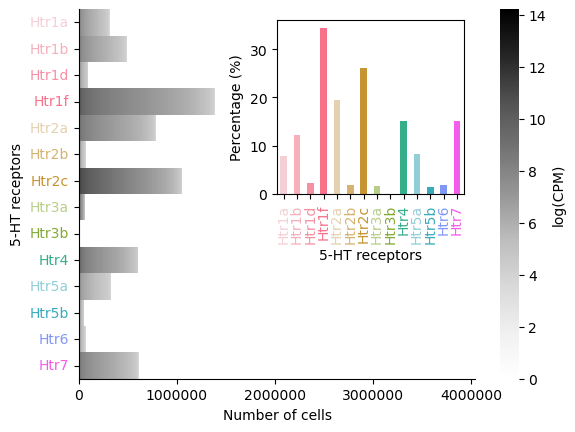

In [541]:
def expr_htrs_whole_brain(ax_, exp):
    sns.heatmap(pd.DataFrame(np.sort(exp.values, axis=0)[::-200], columns=exp.columns, 
                                  index=exp.reset_index().index[::200]).T, xticklabels=5000, cbar_kws={'label': 'log(CPM)'}, cmap="Greys", ax=ax)
    ax.set_xlabel("Number of cells")
    ax.set_ylabel("5-HT receptors")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    
    colors_list = [htr_cmap_rgb[receptor] for receptor in exp.columns]
    
    for ytick in ax.get_yticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])
    
    axins = ax.inset_axes( [0.5, 0.5, 0.47, 0.47])
    ((exp.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
    axins.set_xlabel("5-HT receptors")
    axins.set_ylabel("Percentage (%)")
    
    for xtick in axins.get_xticklabels():
        xtick.set_color(htr_cmap_rgb[xtick.get_text()])

fig, ax = plt.subplots()
expr_htrs_whole_brain(ax, exp)

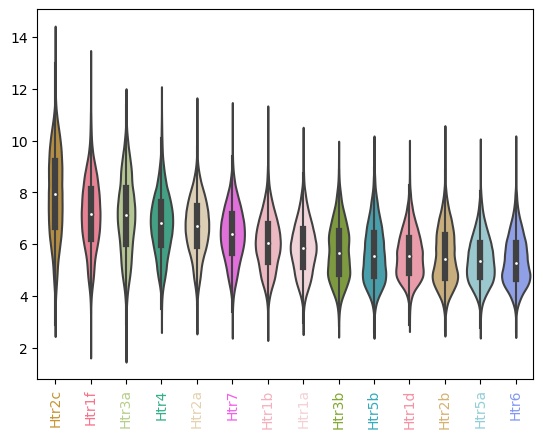

In [295]:
ax = sns.violinplot(exp[exp>0].loc[:,exp[exp>0].mean().sort_values(ascending=False).index], palette=htr_cmap_rgb)
for xtick in ax.get_xticklabels():
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])
    xtick.set_rotation(90)

In [664]:
joined_any_htr =  cell.join( exp.any(axis=1).rename("htr"))

donor_counts = cell['donor_label'].value_counts()
valid_donors = donor_counts[donor_counts > 1000].index

joined_any_htr = joined_any_htr[joined_any_htr['donor_label'].isin(valid_donors)]

<AxesSubplot:xlabel='broad_division', ylabel='htr'>

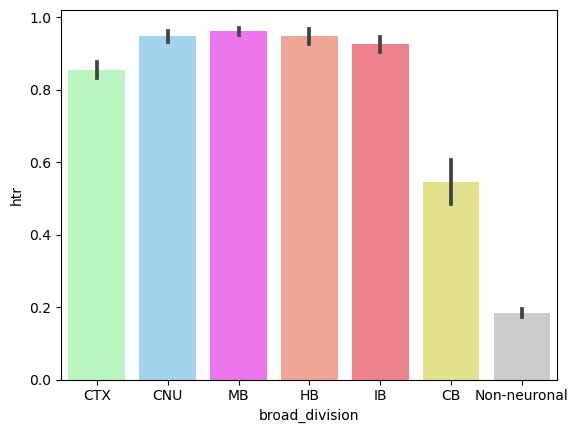

In [632]:

sns.barplot(data=(joined_any_htr.groupby(["broad_division", 'donor_label'])["htr"].sum()/joined_any_htr.groupby(["broad_division", 'donor_label'])["htr"].size()).reset_index(), y="htr", x="broad_division", palette= broad_division_color_map, order=order_broad_division )

## Difference between Htr1 and htr2 UMAP distribtion

In [662]:
def diff_htr1_htr2_umap(axs):
    _ = subsampled.dropna()
    
    legend_handles = []
    
    # Create a Patch (a colored box) for each name and color, and add it to legend_handles
    for name in order_broad_division:
        
        legend_handles.append(mpatches.Patch(color=broad_division_color_map[name], label=name))
    
    axs[0].legend(handles=legend_handles, title='Broad Division', ncol=int(np.ceil(len(legend_handles)/2)), loc='upper left', bbox_to_anchor=(0, 1.12),
             handlelength=.5, handletextpad=0.1, borderaxespad=0, framealpha=.2)
    
    axs[0].scatter(_['x'], _['y'], c=_["broad_division_color"], s=0.5, marker='.')
    axs[0].axis('off')
    
    for gene in families["Htr1"]:
       axs[1].scatter(_['x'], _['y'], c=_[gene], s=0.5, marker='.', cmap="Reds")
    axs[1].axis('off')
    axs[1].set_title('Htr1 family')
    
    for gene in families["Htr2"]:  
       axs[2].scatter(_['x'], _['y'], c=_[gene], s=0.5, marker='.', cmap='YlOrBr')
    
    axs[2].axis('off')
    axs[2].set_title('Htr2 family')


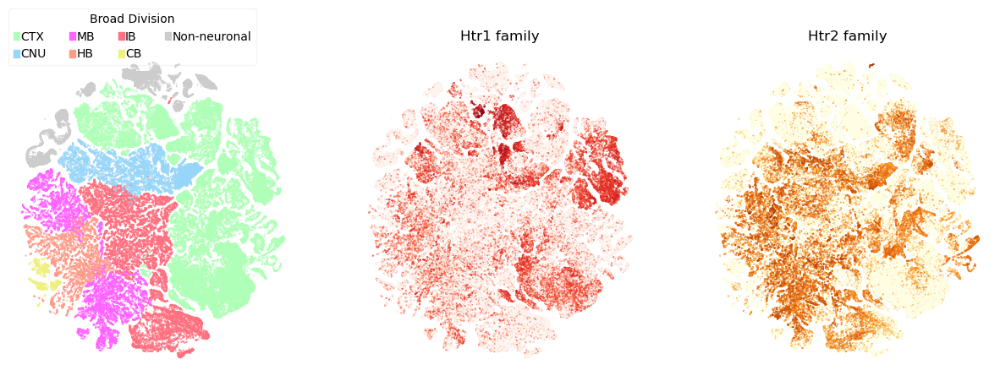

In [663]:
fig, axs = plt.subplots(1,3, figsize=(15,5))
diff_htr1_htr2_umap(axs)

## UMAP 5-HT receptors vs neurotransmitter, class, region

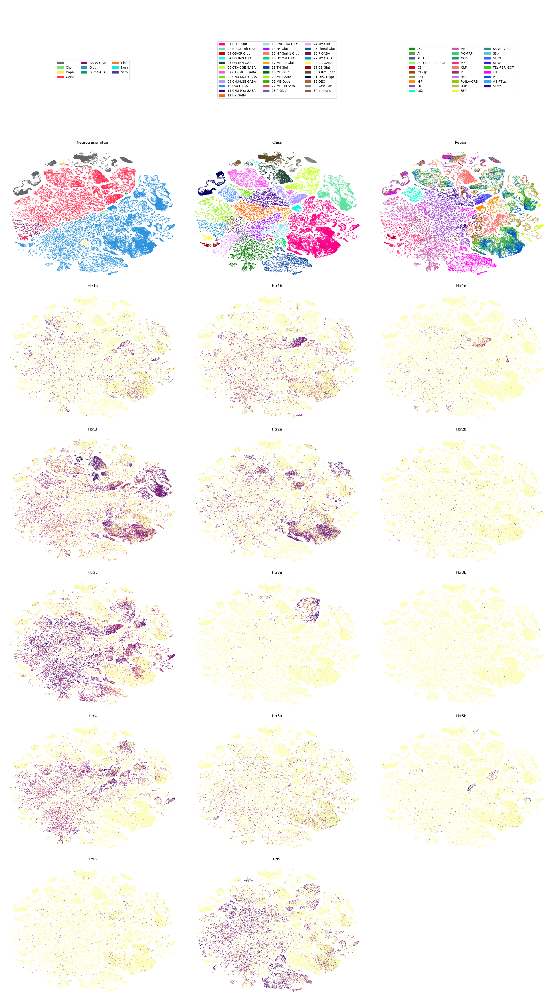

In [238]:
k = len(htrgenes) + 6

# Calculate number of rows for the grid
ncols = 3
nrows = int(np.ceil(k / ncols))

# Create a figure with the desired overall width and height
fig, axs = plt.subplots(nrows,ncols,figsize=(25,45))

for n, item in enumerate(["neurotransmitter", "class"]):      
    _ = subsampled[[item, item + "_color"]].drop_duplicates()
    _ = _.sort_values(item)
    # Create custom legend elements
    legend_elements = [mpatches.Patch(color=row[item + '_color'], label=row[item]) for x, row in _.iterrows()]
    axs[0,n].legend(handles=legend_elements, ncol=3, loc="center")

_ = subsampled[["region_of_interest_acronym", "region_of_interest_color"]].drop_duplicates()
_ = _.sort_values("region_of_interest_acronym")
# Create custom legend elements
legend_elements = [mpatches.Patch(color=row["region_of_interest_color"], label=row["region_of_interest_acronym"]) for x, row in _.iterrows()]
axs[0,2].legend(handles=legend_elements, ncol=3, loc="center")

axs[1,0].scatter(subsampled['x'], subsampled['y'], c=subsampled['neurotransmitter_color'], s=0.5, marker='.')
axs[1,0].set_title("Neurotransmitter") 
axs[1,2].scatter(subsampled['x'], subsampled['y'], c=subsampled['region_of_interest_color'], s=0.5, marker='.')
axs[1,2].set_title("Region") 
axs[1,1].scatter(subsampled['x'], subsampled['y'], c=subsampled['class_color'], s=0.5, marker='.')
axs[1,1].set_title("Class") 

for n, gene in enumerate(htrgenes):
    row = n // ncols
    col = n % ncols
    sc = axs[row + 2, col ].scatter(subsampled['x'], subsampled['y'], c=subsampled[gene], s=0.5, marker='.', cmap=plt.cm.magma_r)
    axs[row + 2, col].set_title(gene) 

for ax_row in axs:
    for ax in ax_row:
        ax.axis('off')

plt.tight_layout()

## expression htr grouped by neurotransmitter

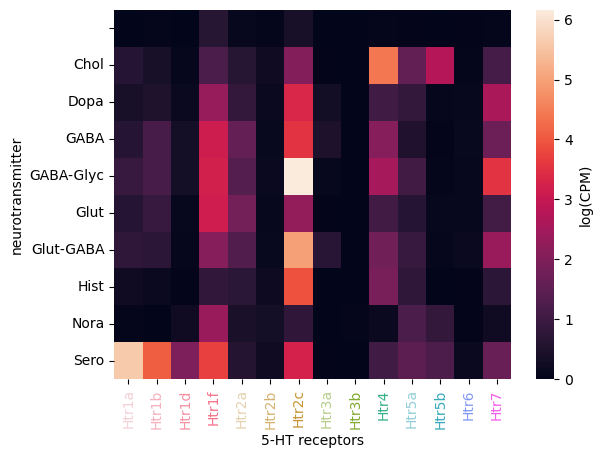

In [276]:
ax = sns.heatmap(joined.groupby("neurotransmitter")[htrgenes].mean(), yticklabels=True, cbar_kws={'label': 'log(CPM)'}, cmap="rocket", ax=ax)
ax.set_xlabel("5-HT receptors")
for ytick in ax.get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])



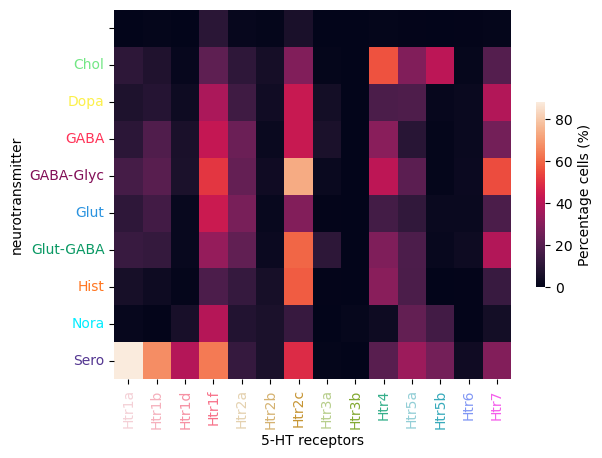

In [655]:
def expr_htrs_by_neurotransmitter(ax):
    sns.heatmap(joined_boolean.groupby("neurotransmitter")[htrgenes].sum().div(joined.groupby("neurotransmitter").size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)', "shrink": 0.5}, cmap="rocket", ax=ax)
    ax.set_xlabel("5-HT receptors")
    for ytick in ax.get_xticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])
    for ytick in ax.get_yticklabels():
        ytick.set_color(neurotransmitter_color_map[ytick.get_text()])

fig, ax = plt.subplots()
expr_htrs_by_neurotransmitter(ax)

## expression across regions 

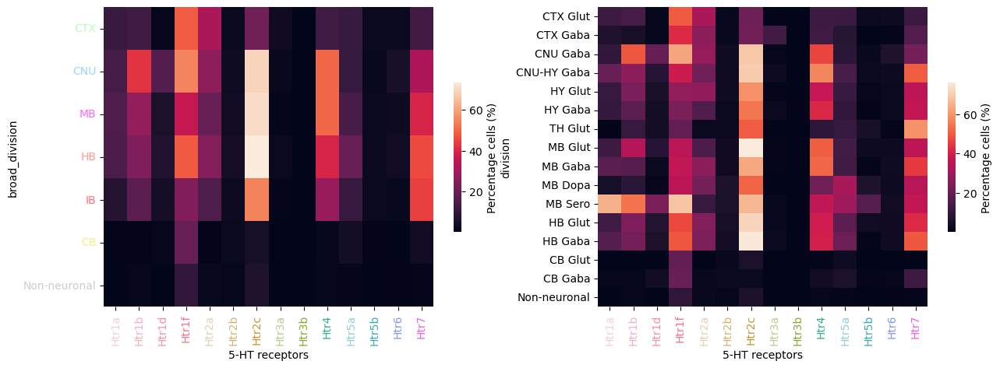

In [643]:
def expr_htrs_by_area(axs):
    sns.heatmap(joined_boolean.groupby("broad_division")[htrgenes].sum().div(joined.groupby("broad_division").size(), axis="index").loc[order_broad_division] * 100,
                yticklabels=True, cbar_kws={'label': 'Percentage cells (%)', "shrink": 0.5}, ax=axs[0], )
    axs[0].set_xlabel("5-HT receptors")
    for ytick in axs[0].get_xticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])
    for ytick in axs[0].get_yticklabels():
        ytick.set_color( broad_division_color_map[ytick.get_text()])
    
    sns.heatmap(joined_boolean.groupby("division")[htrgenes].sum().div(joined.groupby("division").size(), axis="index").loc[order_division] * 100,
                yticklabels=True, cbar_kws={'label': 'Percentage cells (%)', "shrink": 0.5}, ax=axs[1])
    axs[1].set_xlabel("5-HT receptors")
    for ytick in axs[1].get_xticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])

fig, axs = plt.subplots(1,2, figsize=(15,5))
expr_htrs_by_area(axs)

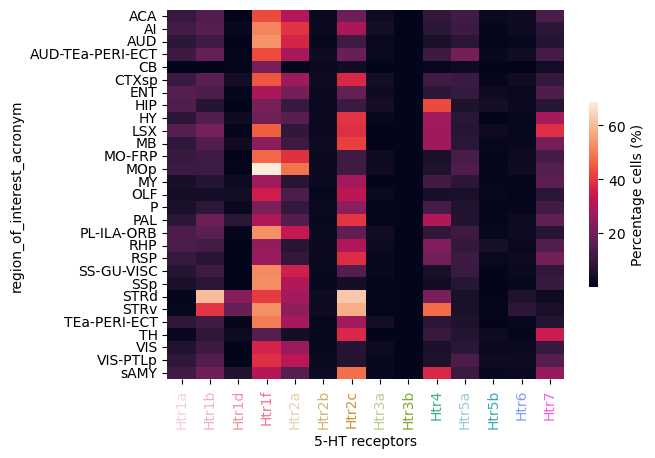

In [480]:
ax = sns.heatmap(joined_boolean.groupby("region_of_interest_acronym")[htrgenes].sum().div(joined.groupby("region_of_interest_acronym").size(), axis="index") * 100,
            yticklabels=True,cbar_kws={'label': 'Percentage cells (%)', "shrink": 0.5})
ax.set_xlabel("5-HT receptors")
for ytick in ax.get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

## expression across classes

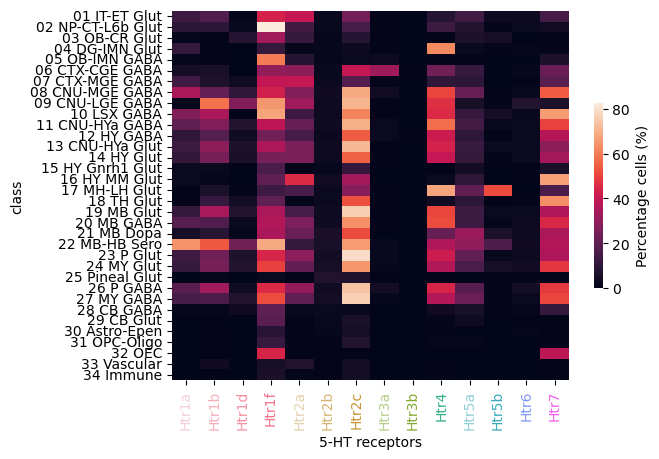

In [481]:
def expr_htrs_by_classes(ax): 
    sns.heatmap(joined_boolean.groupby("class")[htrgenes].sum().div(joined.groupby("class").size(), axis="index") * 100,
                yticklabels=True, cbar_kws={'label': 'Percentage cells (%)', "shrink": 0.5}, ax=ax)
    ax.set_xlabel("5-HT receptors")
    for ytick in ax.get_xticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])

fig, ax = plt.subplots()
expr_htrs_by_classes(ax)

# Figure 1

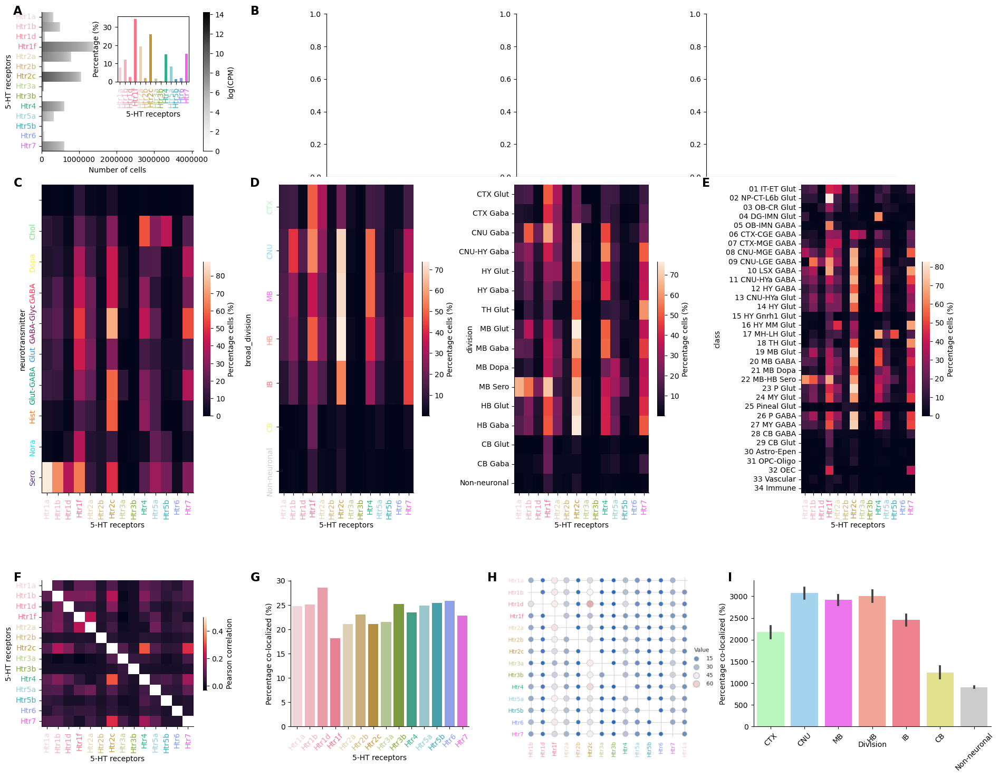

In [774]:
fig = plt.figure(figsize=(18, 14))
gs = gridspec.GridSpec(3, 4, height_ratios=[1, 2.3, 1])

subfig = fig.add_subfigure(gs[0,0])
ax = subfig.subplots()
subfig.suptitle("A", x=-.0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0,left=0.1, bottom=.15, top=.96)
expr_htrs_whole_brain(ax, exp)

subfig = fig.add_subfigure(gs[0,1:])
axs = subfig.subplots(1,3)
subfig.suptitle("B", x=0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0, left=0.1, bottom=0, top=.95)
diff_htr1_htr2_umap(axs)

subfig = fig.add_subfigure(gs[1,0])
ax = subfig.subplots()
subfig.suptitle("C", x=-.0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0,  left=0.1, bottom=.2, top=.98)
expr_htrs_by_neurotransmitter(ax)

subfig = fig.add_subfigure(gs[1,1:3])
axs = subfig.subplots(1,2)
subfig.suptitle("D", x=0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=.4, left=0.05, bottom=.2, top=.98)
expr_htrs_by_area(axs)
axs[0].yaxis.set_label_coords(-0.2, 0.5) 
axs[1].yaxis.set_label_coords(-0.3, 0.5) 

subfig = fig.add_subfigure(gs[1,3])
axs = subfig.subplots()
subfig.suptitle("E", x=-.1, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0.5, left=0.3, bottom=.2, top=.98)
expr_htrs_by_classes(axs)
axs.yaxis.set_label_coords(-0.7, 0.5) 

subfig = fig.add_subfigure(gs[2,0])
ax = subfig.subplots()
subfig.suptitle("F", x=-.0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0,  left=0.1, bottom=.1, top=.95)
corr_htrs(ax)

subfig = fig.add_subfigure(gs[2,1])
ax = subfig.subplots()
subfig.suptitle("G", x=0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0,  left=0.15, bottom=.1, top=.95)
plot_coloc(ax)

subfig = fig.add_subfigure(gs[2,2])
ax = subfig.subplots()
subfig.suptitle("H", x=0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0,  left=-.1, bottom=-.1, top=.99, right=1.1)
g = scatterheat_coloc()
g.savefig(f"{output_folder_figures_calculations}/scatterheat.png")
img = plt.imread(f"{output_folder_figures_calculations}/scatterheat.png")
ax.imshow(img) 
ax.axis('off')

subfig = fig.add_subfigure(gs[2,3])
ax = subfig.subplots()
subfig.suptitle("I", x=0, y=1, fontsize=16, fontweight='bold');
subfig.subplots_adjust(wspace=0,  left=0.1, bottom=.1, top=.95)
coloc_by_broad_division(ax)
ax.xaxis.set_label_coords(0.5, -.2) 

# Correlation

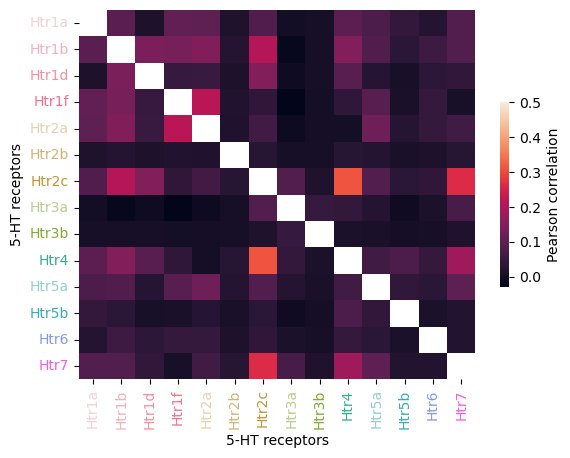

In [773]:
def corr_htrs(ax): 
    _ = exp.corr()
    sns.heatmap(_[_<1], vmax=.5, ax=ax, cbar_kws={'label': 'Pearson correlation', "shrink": 0.5})
    for ytick in ax.get_xticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])
    for ytick, color in zip(ax.get_yticklabels(), colors_list):
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])
    ax.set_xlabel("5-HT receptors")
    ax.set_ylabel("5-HT receptors")
fig, ax = plt.subplots()
corr_htrs(ax)

# Co-expression

## Percentage colocalize in whole brain

In [256]:
coexp = {}
for gene_target in tqdm(htrgenes):
    for gene_to_check in htrgenes: 
        coexp[gene_target, gene_to_check] = joined_boolean[[gene_target, gene_to_check]].all(axis=1).sum()/(joined_boolean[gene_target]>0).sum()

  0%|          | 0/14 [00:00<?, ?it/s]

In [257]:
coloc = pd.DataFrame.from_dict(coexp, orient='index', columns=['Value'])
coloc[['Gene1', 'Gene2']] = pd.DataFrame(coloc.index.tolist(), index=coloc.index)
coloc = coloc.reset_index(drop=True)

# Reorder the columns for clarity
coloc = coloc[['Gene1', 'Gene2', 'Value']]
coloc["Value"] = coloc["Value"] * 100

In [258]:
coloc.to_pickle("/home/roberto/Github/Transcriptomics-5-HT/processed/colocalization_broad.pkl")

In [724]:
coloc = pd.read_pickle("/home/roberto/Github/Transcriptomics-5-HT/processed/colocalization_broad.pkl")

## how many cells expressing any htr express also the receptor on the xaxis?

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


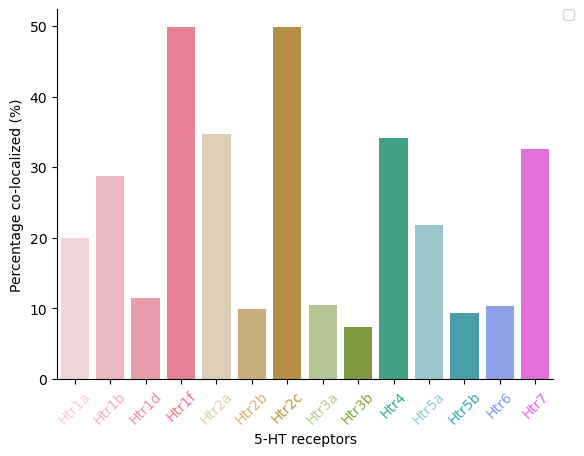

In [725]:
ax = sns.barplot(data=coloc.groupby( "Gene2")["Value"].mean().reset_index(), x="Gene2", y="Value", palette=htr_cmap)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax.set_xlabel("5-HT receptors")
ax.set_ylabel("Percentage co-localized (%)")
ax.tick_params(axis='x', rotation=45)
for ytick in ax.get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])
sns.despine()

## how many cells expressing htr in xaxis express also another receptor?

In [764]:
def plot_coloc(ax):
    sns.barplot(data=coloc.groupby( "Gene1")["Value"].mean().reset_index(), x="Gene1", y="Value", palette=htr_cmap, ax=ax)
    ax.set_xlabel("5-HT receptors")
    ax.set_ylabel("Percentage co-localized (%)")
    ax.tick_params(axis='x', rotation=45)
    for ytick in ax.get_xticklabels():
        ytick.set_color(htr_cmap_rgb[ytick.get_text()])

    sns.despine()


<Figure size 640x480 with 0 Axes>

In [757]:
def scatterheat_coloc():
    with sns.axes_style("whitegrid"):
        g = sns.relplot(
            data=coloc[coloc["Value"]<100],
            y="Gene1", x="Gene2", hue="Value", size="Value",
            palette="vlag", hue_norm=(0, 100), edgecolor=".7",
            height=5, sizes=(50, 150), size_norm=(coloc[coloc["Value"]<100]["Value"].min(), coloc[coloc["Value"]<100]["Value"].max()),
        )
        g.set(xlabel="", ylabel="", aspect="equal")
        g.despine(left=True, bottom=True)
        g.ax.margins(.02)
        for label in g.ax.get_xticklabels():
            label.set_rotation(90)
        for artist in g.legend.legendHandles:
            artist.set_edgecolor(".7")
        
        for ax in g.axes.flat:  # Loop through the individual axes
            for label in ax.get_xticklabels():
                # Your code to modify the x-tick labels goes here
                label.set_color(htr_cmap_rgb[label.get_text()])
            for label in ax.get_yticklabels():
                # Your code to modify the x-tick labels goes here
                label.set_color(htr_cmap_rgb[label.get_text()])
    plt.close()
    return g
g = scatterheat_coloc()

In [735]:
g.savefig("fvvvsfvsfvsdv")

## Coexpression by division

In [ ]:
coexp = {}
for division in tqdm(joined_boolean["broad_division"].unique()):
    for gene_target in htrgenes:
        for gene_to_check in tqdm(htrgenes): 
            coexp[gene_target, gene_to_check, division] = joined_boolean[joined_boolean["broad_division"]==division][[gene_target, gene_to_check]].all(axis=1).sum()/(joined_boolean[joined_boolean["broad_division"]==division][gene_target]>0).sum()


In [519]:
coloc = pd.DataFrame.from_dict(coexp, orient='index', columns=['Value'])
coloc[['Gene1', 'Gene2', "broad_division"]] = pd.DataFrame(coloc.index.tolist(), index=coloc.index)
coloc = coloc.reset_index(drop=True)

# Reorder the columns for clarity
coloc = coloc[["broad_division",'Gene1', 'Gene2', 'Value']]


In [630]:
output_folder_calculations

PosixPath('/alzheimer/Roberto/Allen_Institute/Processed_data_transcriptomics_HTRs')

In [705]:
coloc.to_pickle(f"{output_folder_calculations}/broad_division_colocalization.pkl")

In [713]:
coloc = pd.read_pickle(f"{output_folder_calculations}/broad_division_colocalization.pkl")

In [714]:
coloc["Value"] = coloc["Value"] * 100

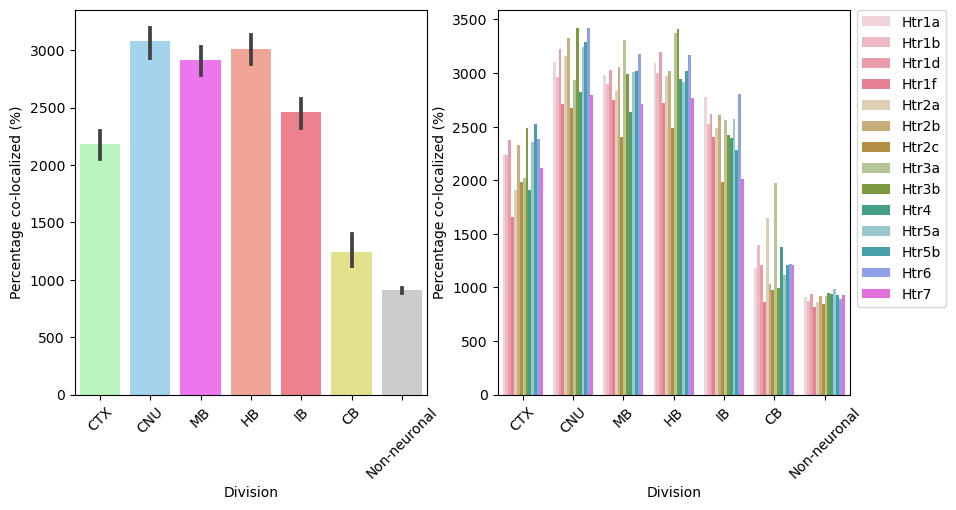

In [721]:
fig, axs = plt.subplots(1,2, figsize=(10,5))
# Create the line plot
sns.barplot(
    data=coloc.groupby(["broad_division", "Gene1"])["Value"].mean().reset_index(),
    hue="Gene1", y="Value", x="broad_division", palette=htr_cmap, ax=axs[1], order = order_broad_division
)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
axs[1].set_xlabel("Division")
axs[1].set_ylabel("Percentage co-localized (%)")

axs[1].tick_params(axis='x', rotation=45)

sns.barplot(
    data=coloc.groupby(["broad_division", "Gene1"])["Value"].mean().reset_index(),
    y="Value", x="broad_division", palette=broad_division_color_map, ax=axs[0], order = order_broad_division
)

axs[0].set_xlabel("Division")
axs[0].set_ylabel("Percentage co-localized (%)")

axs[0].tick_params(axis='x', rotation=45)


In [718]:
coloc.groupby(["broad_division", "Gene1"])["Value"].mean().reset_index()

,broad_division,Gene1,Value
0,CB,Htr1a,1176.658163
1,CB,Htr1b,1396.487673
2,CB,Htr1d,1205.130273
3,CB,Htr1f,860.643781
4,CB,Htr2a,1646.077014
...,...,...,...
93,Non-neuronal,Htr4,935.168972
94,Non-neuronal,Htr5a,986.547565
95,Non-neuronal,Htr5b,928.228728
96,Non-neuronal,Htr6,894.242681


In [729]:
def coloc_by_broad_division(ax):

    coloc = pd.read_pickle(f"{output_folder_calculations}/broad_division_colocalization.pkl")
    coloc["Value"] = coloc["Value"] * 100
    sns.barplot(
    data=coloc.groupby(["broad_division", "Gene1"])["Value"].mean().reset_index(),
    y="Value", x="broad_division", palette=broad_division_color_map, ax=ax, order = order_broad_division
)

    ax.set_xlabel("Division")
    ax.set_ylabel("Percentage co-localized (%)")
    
    ax.tick_params(axis='x', rotation=45)
    sns.despine()

In [ ]:
coexp = {}
for division in tqdm(joined_boolean["division"].unique()):
    for gene_target in htrgenes:
        for gene_to_check in tqdm(htrgenes): 
            coexp[gene_target, gene_to_check, division] = joined_boolean[joined_boolean["division"]==division][[gene_target, gene_to_check]].all(axis=1).sum()/(joined_boolean[joined_boolean["division"]==division][gene_target]>0).sum()


In [ ]:
coloc = pd.DataFrame.from_dict(coexp, orient='index', columns=['Value'])
coloc[['Gene1', 'Gene2', "Division"]] = pd.DataFrame(coloc.index.tolist(), index=coloc.index)
coloc = coloc.reset_index(drop=True)

# Reorder the columns for clarity
coloc = coloc[["Division",'Gene1', 'Gene2', 'Value']]


In [ ]:
coloc.to_pickle("/home/roberto/Github/Transcriptomics-5-HT/processed/colocalization.pkl")

In [514]:
coloc = pd.read_pickle("/home/roberto/Github/Transcriptomics-5-HT/processed/colocalization.pkl")

In [515]:
coloc["Value"] = coloc["Value"] * 100

### how many of the cells expressing the receptor on x axis express another 5-HT receptor

KeyError: 'Division'

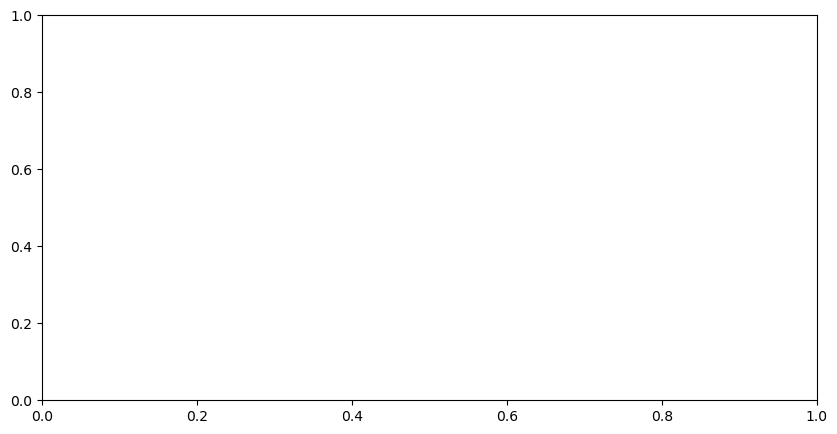

In [513]:
fig, ax = plt.subplots(figsize=(10,5))
# Create the line plot
ax = sns.barplot(
    data=coloc.groupby(["Division", "Gene1"])["Value"].mean().reset_index(),
    hue="Gene1", y="Value", x="Broad_division", palette=htr_cmap
)

plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax.set_xlabel("Division")
ax.set_ylabel("Percentage co-localized (%)")

ax.tick_params(axis='x', rotation=45)



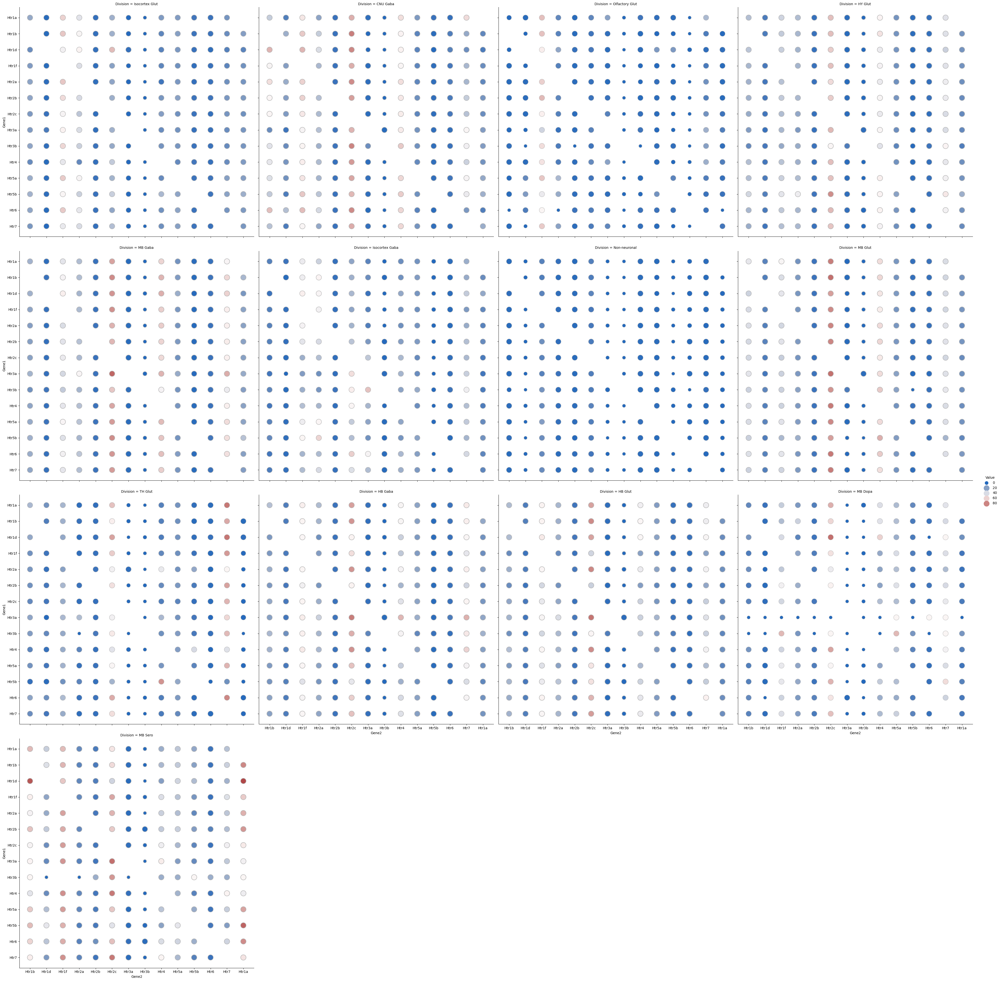

In [170]:
rg = sns.relplot(
    data=coloc[coloc["Value"]<100],
    y="Gene1", x="Gene2", hue="Value", size="Value",
    palette="vlag", hue_norm=(0, 100), edgecolor=".7",
    height=10, sizes=(50, 250), size_norm=(-.2, .8), col= "Division", col_wrap=4
)
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)

for artist in g.legend.legendHandles:
    artist.set_edgecolor(".7")



# CTX

In [175]:
group = "subclass"
area = "CTX"
sub_joined = joined[joined["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean = joined_boolean[joined_boolean["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean_top_10 = joined_boolean_top_10[joined_boolean_top_10["broad_division"].isin([area])].sort_values(group)

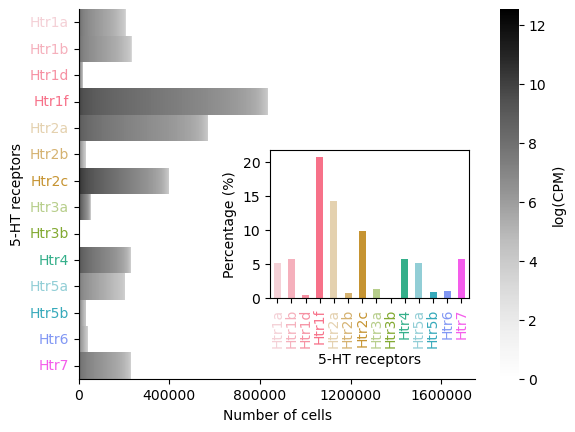

In [178]:
_ = sub_joined[htrgenes]
ax = sns.heatmap(pd.DataFrame(np.sort(_.values, axis=0)[::-200], columns=_.columns, 
                              index=_.reset_index().index[::200]).T, xticklabels=2000, cbar_kws={'label': 'log(CPM)'}, cmap="Greys")
ax.set_xlabel("Number of cells")
ax.set_ylabel("5-HT receptors")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

colors_list = [htr_cmap_rgb[receptor] for receptor in _.columns]

for ytick, color in zip(ax.get_yticklabels(), colors_list):
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

axins = inset_axes(ax, width="50%", height="40%", loc=4, bbox_to_anchor=(0, 0.2, 1, 1),  # (x, y, width, height) of the bounding box
    bbox_transform=ax.transAxes,  # coordinate system transformation
    )
((_.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
axins.set_xlabel("5-HT receptors")
axins.set_ylabel("Percentage (%)")

for xtick in axins.get_xticklabels():
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])

In [180]:
sub_joined.groupby(group).size()

subclass
001 CLA-EPd-CTX Car3 Glut     30090
002 IT EP-CLA Glut            24813
003 L5/6 IT TPE-ENT Glut      11854
004 L6 IT CTX Glut           108913
005 L5 IT CTX Glut            66624
006 L4/5 IT CTX Glut         369221
007 L2/3 IT CTX Glut         172213
008 L2/3 IT ENT Glut          21111
009 L2/3 IT PIR-ENTl Glut     61035
010 IT AON-TT-DP Glut         32454
011 L2 IT ENT-po Glut          3704
012 MEA Slc17a7 Glut          10120
013 COAp Grxcr2 Glut          13481
014 LA-BLA-BMA-PA Glut        20485
015 ENTmv-PA-COAp Glut         3434
016 CA1-ProS Glut             31474
017 CA3 Glut                   5229
018 L2 IT PPP-APr Glut         5176
019 L2/3 IT PPP Glut          28457
020 L2/3 IT RSP Glut          33940
021 L4 RSP-ACA Glut            6615
022 L5 ET CTX Glut            24721
023 SUB-ProS Glut              6844
024 L5 PPP Glut                1428
025 CA2-FC-IG Glut              640
026 NLOT Rho Glut              1408
027 L6b EPd Glut               4060
028 L6b/CT ENT Glut

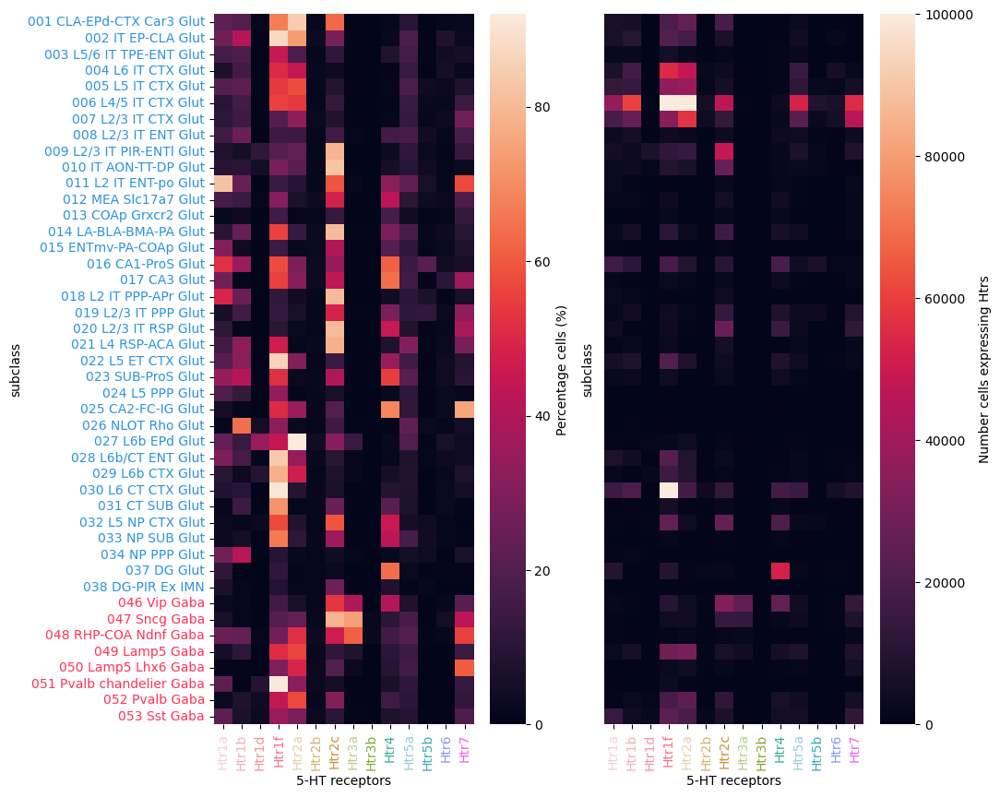

In [181]:
fig,axs = plt.subplots(1,2, figsize=(10,10))
sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum().div(sub_joined.groupby(group).size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)'}, ax=axs[0])
axs[0].set_xlabel("5-HT receptors")
for ytick in axs[0].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum() ,
            yticklabels=False, cbar_kws={'label': 'Number cells expressing Htrs'}, ax=axs[1], vmax=100000)
axs[1].set_xlabel("5-HT receptors")
for ytick in axs[1].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

for ytick in axs[0].get_yticklabels():
    ytick.set_color(sub_joined[sub_joined[group]==ytick.get_text()]['neurotransmitter_color'][0])


# CNU

In [183]:
group = "subclass"
area = "CNU"
sub_joined = joined[joined["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean = joined_boolean[joined_boolean["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean_top_10 = joined_boolean_top_10[joined_boolean_top_10["broad_division"].isin([area])].sort_values(group)

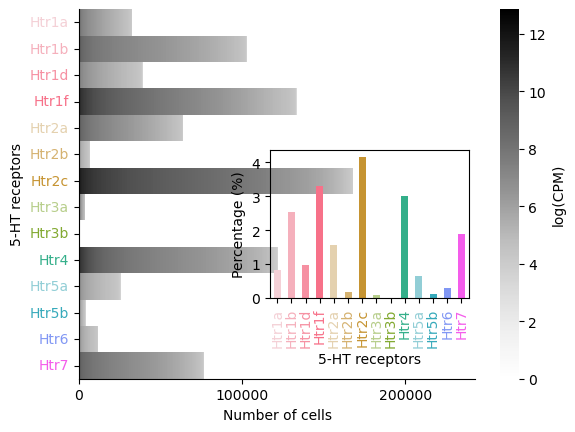

In [186]:
_ = sub_joined[htrgenes]
ax = sns.heatmap(pd.DataFrame(np.sort(_.values, axis=0)[::-200], columns=_.columns, 
                              index=_.reset_index().index[::200]).T, xticklabels=500, cbar_kws={'label': 'log(CPM)'}, cmap="Greys")
ax.set_xlabel("Number of cells")
ax.set_ylabel("5-HT receptors")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

colors_list = [htr_cmap_rgb[receptor] for receptor in _.columns]

for ytick, color in zip(ax.get_yticklabels(), colors_list):
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

axins = inset_axes(ax, width="50%", height="40%", loc=4, bbox_to_anchor=(0, 0.2, 1, 1),  # (x, y, width, height) of the bounding box
    bbox_transform=ax.transAxes,  # coordinate system transformation
    )
((_.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
axins.set_xlabel("5-HT receptors")
axins.set_ylabel("Percentage (%)")
axins.patch.set_alpha(0.1)

for xtick, color in zip(axins.get_xticklabels(), colors_list):
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])

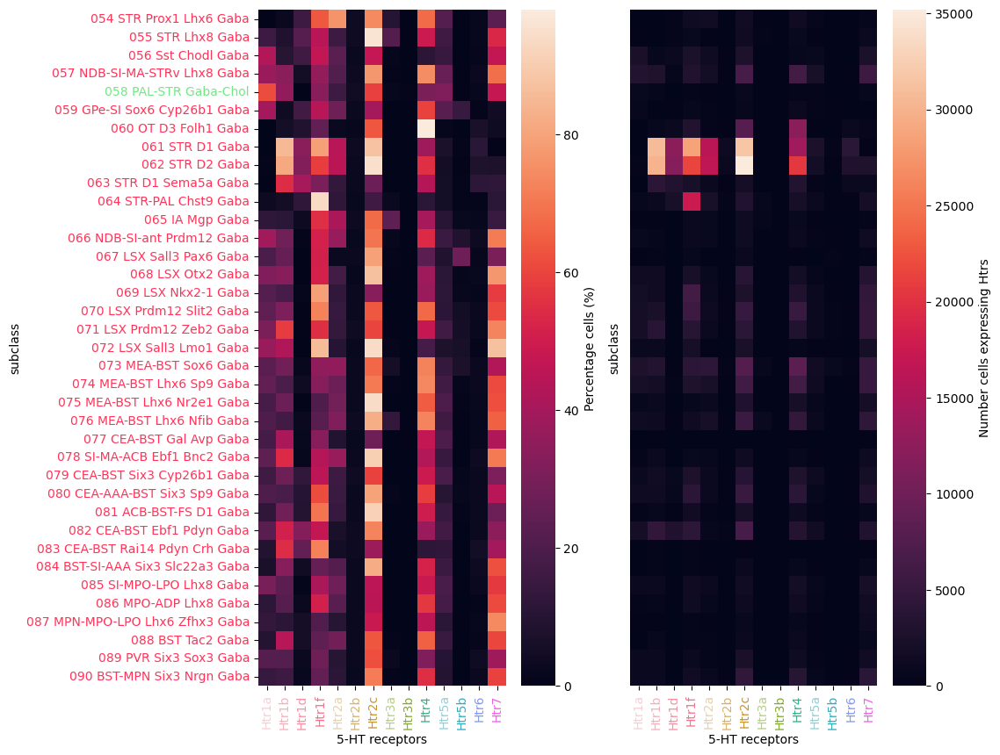

In [187]:
fig,axs = plt.subplots(1,2, figsize=(10,10))
sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum().div(sub_joined.groupby(group).size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)'}, ax=axs[0])
axs[0].set_xlabel("5-HT receptors")
for ytick in axs[0].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum() ,
            yticklabels=False, cbar_kws={'label': 'Number cells expressing Htrs'}, ax=axs[1])
axs[1].set_xlabel("5-HT receptors")
for ytick in axs[1].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

for ytick in axs[0].get_yticklabels():
    ytick.set_color(sub_joined[sub_joined["subclass"]==ytick.get_text()]['neurotransmitter_color'][0])


# IB

In [188]:
group = "subclass"
area = "IB"
sub_joined = joined[joined["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean = joined_boolean[joined_boolean["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean_top_10 = joined_boolean_top_10[joined_boolean_top_10["broad_division"].isin([area])].sort_values(group)

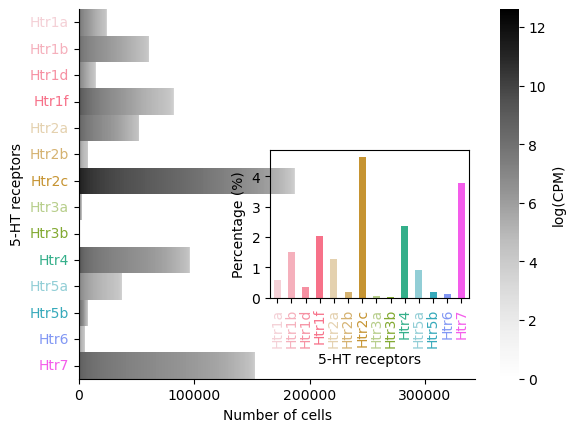

In [189]:
_ = sub_joined[htrgenes]
ax = sns.heatmap(pd.DataFrame(np.sort(_.values, axis=0)[::-200], columns=_.columns, 
                              index=_.reset_index().index[::200]).T, xticklabels=500, cbar_kws={'label': 'log(CPM)'}, cmap="Greys")
ax.set_xlabel("Number of cells")
ax.set_ylabel("5-HT receptors")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

colors_list = [htr_cmap_rgb[receptor] for receptor in _.columns]

for ytick, color in zip(ax.get_yticklabels(), colors_list):
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

axins = inset_axes(ax, width="50%", height="40%", loc=4, bbox_to_anchor=(0, 0.2, 1, 1),  # (x, y, width, height) of the bounding box
    bbox_transform=ax.transAxes,  # coordinate system transformation
    )
((_.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
axins.set_xlabel("5-HT receptors")
axins.set_ylabel("Percentage (%)")
axins.patch.set_alpha(0.1)
for xtick, color in zip(axins.get_xticklabels(), colors_list):
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])

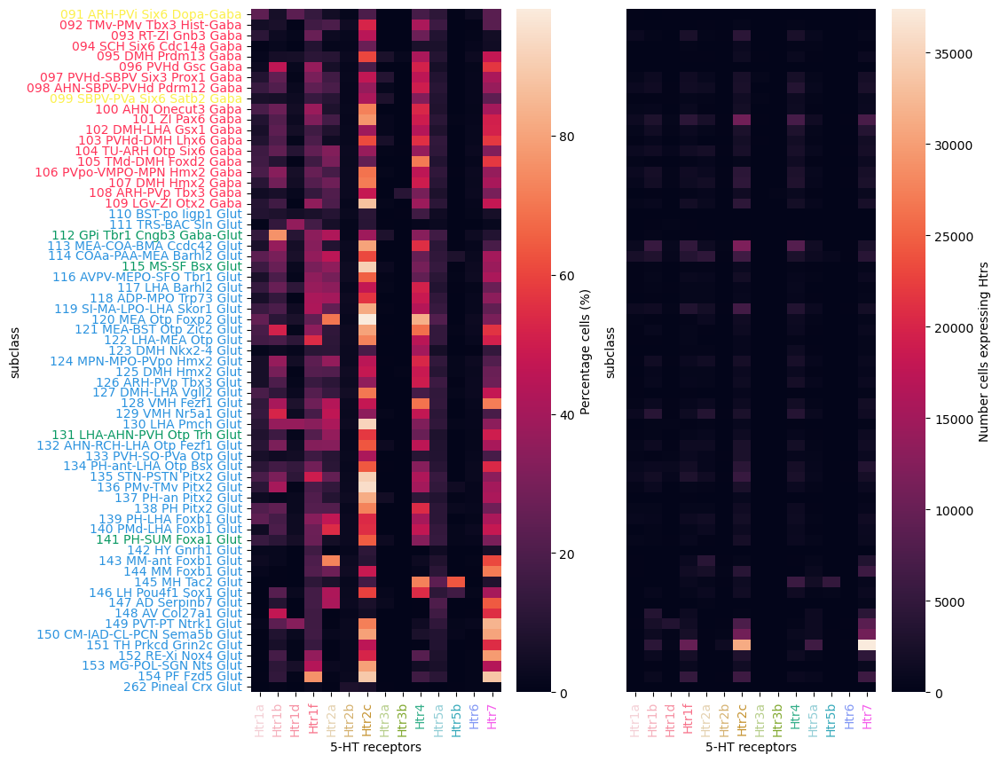

In [190]:
fig,axs = plt.subplots(1,2, figsize=(10,10))
sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum().div(sub_joined.groupby(group).size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)'}, ax=axs[0])
axs[0].set_xlabel("5-HT receptors")
for ytick in axs[0].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum() ,
            yticklabels=False, cbar_kws={'label': 'Number cells expressing Htrs'}, ax=axs[1])
axs[1].set_xlabel("5-HT receptors")
for ytick in axs[1].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

for ytick in axs[0].get_yticklabels():
    ytick.set_color(sub_joined[sub_joined["subclass"]==ytick.get_text()]['neurotransmitter_color'][0])


# MB

In [133]:
group = "subclass"
sub_joined = joined[joined["broad_division"].isin(["MB"])].sort_values(group)
sub_joined_boolean = joined_boolean[joined_boolean["broad_division"].isin(["MB"])].sort_values(group)
sub_joined_boolean_top_10 = joined_boolean_top_10[joined_boolean_top_10["broad_division"].isin(["MB"])].sort_values(group)

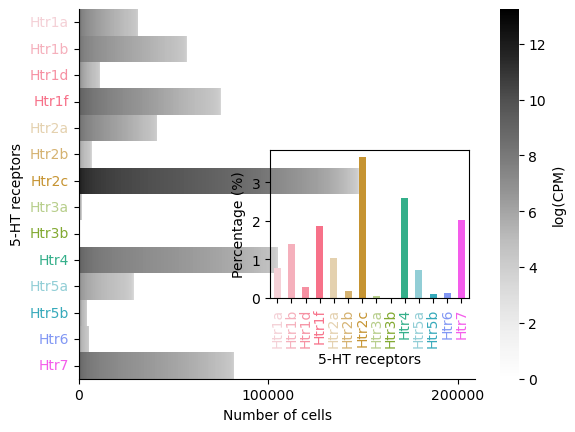

In [134]:
_ = sub_joined[htrgenes]
ax = sns.heatmap(pd.DataFrame(np.sort(_.values, axis=0)[::-200], columns=_.columns, 
                              index=_.reset_index().index[::200]).T, xticklabels=500, cbar_kws={'label': 'log(CPM)'}, cmap="Greys")
ax.set_xlabel("Number of cells")
ax.set_ylabel("5-HT receptors")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

colors_list = [htr_cmap_rgb[receptor] for receptor in _.columns]

for ytick, color in zip(ax.get_yticklabels(), colors_list):
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

axins = inset_axes(ax, width="50%", height="40%", loc=4, bbox_to_anchor=(0, 0.2, 1, 1),  # (x, y, width, height) of the bounding box
    bbox_transform=ax.transAxes,  # coordinate system transformation
    )
((_.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
axins.set_xlabel("5-HT receptors")
axins.set_ylabel("Percentage (%)")
axins.patch.set_alpha(0.1)
for xtick, color in zip(axins.get_xticklabels(), colors_list):
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])

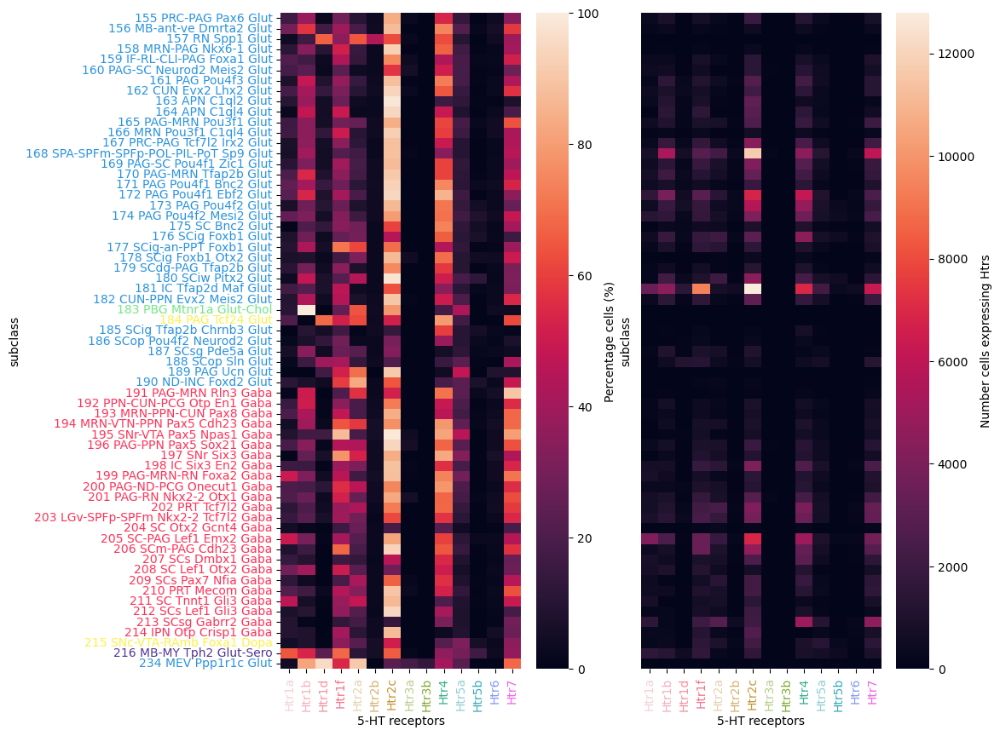

In [78]:
fig,axs = plt.subplots(1,2, figsize=(10,10))
sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum().div(sub_joined.groupby(group).size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)'}, ax=axs[0])
axs[0].set_xlabel("5-HT receptors")
for ytick in axs[0].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum() ,
            yticklabels=False, cbar_kws={'label': 'Number cells expressing Htrs'}, ax=axs[1])
axs[1].set_xlabel("5-HT receptors")
for ytick in axs[1].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

for ytick in axs[0].get_yticklabels():
    ytick.set_color(sub_joined[sub_joined["subclass"]==ytick.get_text()]['neurotransmitter_color'][0])


# HB

In [112]:
group = "subclass"
area = "HB"
sub_joined = joined[joined["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean = joined_boolean[joined_boolean["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean_top_10 = joined_boolean_top_10[joined_boolean_top_10["broad_division"].isin([area])].sort_values(group)

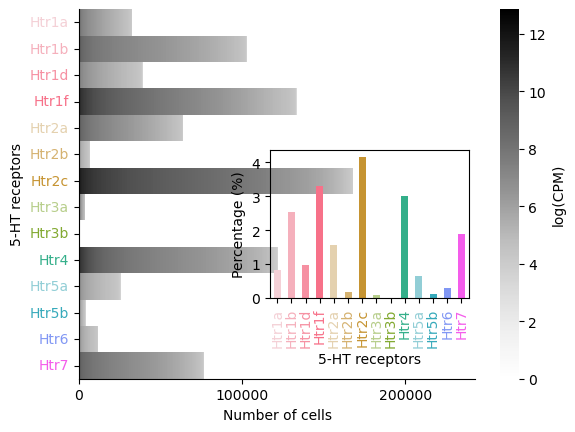

In [128]:
_ = sub_joined[htrgenes]
ax = sns.heatmap(pd.DataFrame(np.sort(_.values, axis=0)[::-200], columns=_.columns, 
                              index=_.reset_index().index[::200]).T, xticklabels=500, cbar_kws={'label': 'log(CPM)'}, cmap="Greys")
ax.set_xlabel("Number of cells")
ax.set_ylabel("5-HT receptors")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

colors_list = [htr_cmap_rgb[receptor] for receptor in _.columns]

for ytick, color in zip(ax.get_yticklabels(), colors_list):
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

axins = inset_axes(ax, width="50%", height="40%", loc=4, bbox_to_anchor=(0, 0.2, 1, 1),  # (x, y, width, height) of the bounding box
    bbox_transform=ax.transAxes,  # coordinate system transformation
    )
((_.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
axins.set_xlabel("5-HT receptors")
axins.set_ylabel("Percentage (%)")
axins.patch.set_alpha(0.1)
for xtick, color in zip(axins.get_xticklabels(), colors_list):
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])

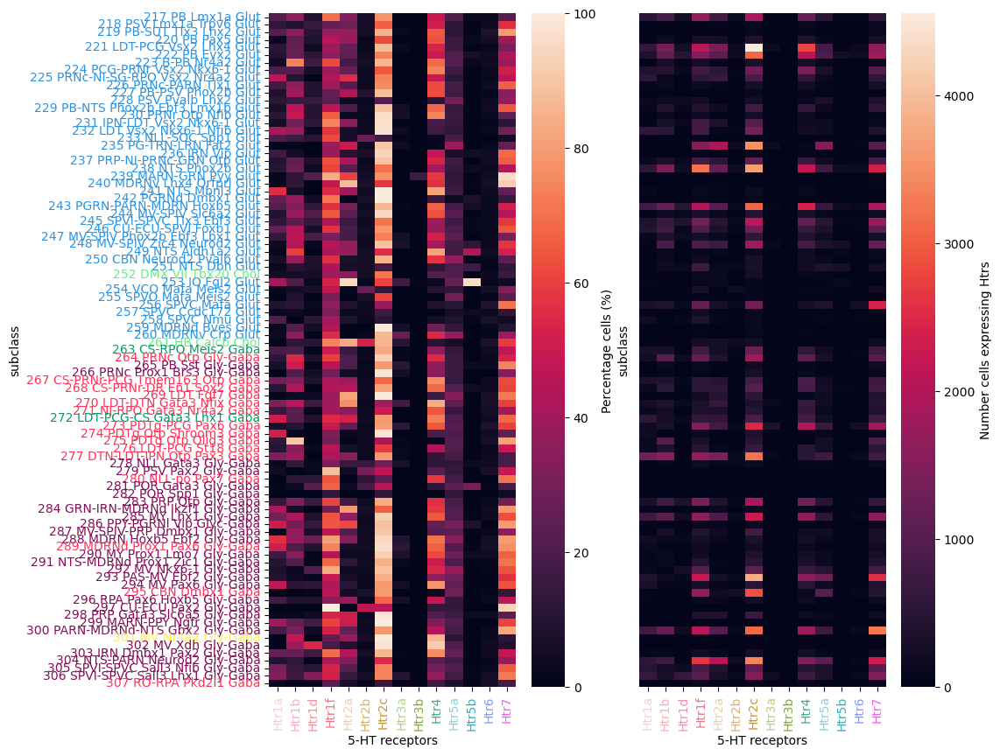

In [114]:
fig,axs = plt.subplots(1,2, figsize=(10,10))
sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum().div(sub_joined.groupby(group).size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)'}, ax=axs[0])
axs[0].set_xlabel("5-HT receptors")
for ytick in axs[0].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum() ,
            yticklabels=False, cbar_kws={'label': 'Number cells expressing Htrs'}, ax=axs[1])
axs[1].set_xlabel("5-HT receptors")
for ytick in axs[1].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

for ytick in axs[0].get_yticklabels():
    ytick.set_color(sub_joined[sub_joined["subclass"]==ytick.get_text()]['neurotransmitter_color'][0])


# CB

In [115]:
group = "subclass"
area = "CB"
sub_joined = joined[joined["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean = joined_boolean[joined_boolean["broad_division"].isin([area])].sort_values(group)
sub_joined_boolean_top_10 = joined_boolean_top_10[joined_boolean_top_10["broad_division"].isin([area])].sort_values(group)

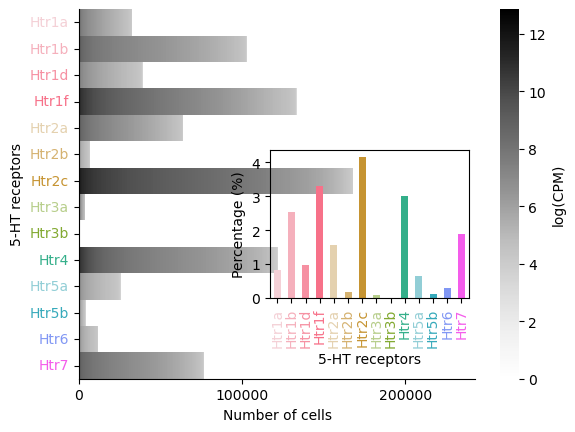

In [126]:
_ = sub_joined[htrgenes]
ax = sns.heatmap(pd.DataFrame(np.sort(_.values, axis=0)[::-200], columns=_.columns, 
                              index=_.reset_index().index[::200]).T, xticklabels=500, cbar_kws={'label': 'log(CPM)'}, cmap="Greys")
ax.set_xlabel("Number of cells")
ax.set_ylabel("5-HT receptors")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

colors_list = [htr_cmap_rgb[receptor] for receptor in _.columns]

for ytick, color in zip(ax.get_yticklabels(), colors_list):
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

axins = inset_axes(ax, width="50%", height="40%", loc=4, bbox_to_anchor=(0, 0.2, 1, 1),  # (x, y, width, height) of the bounding box
    bbox_transform=ax.transAxes,  # coordinate system transformation
    )
((_.astype("bool").sum(axis=0)/exp.shape[0])*100).plot.bar(ax=axins, color=colors_list)
axins.set_xlabel("5-HT receptors")
axins.set_ylabel("Percentage (%)")
axins.patch.set_alpha(0.1)
for xtick, color in zip(axins.get_xticklabels(), colors_list):
    xtick.set_color(htr_cmap_rgb[xtick.get_text()])

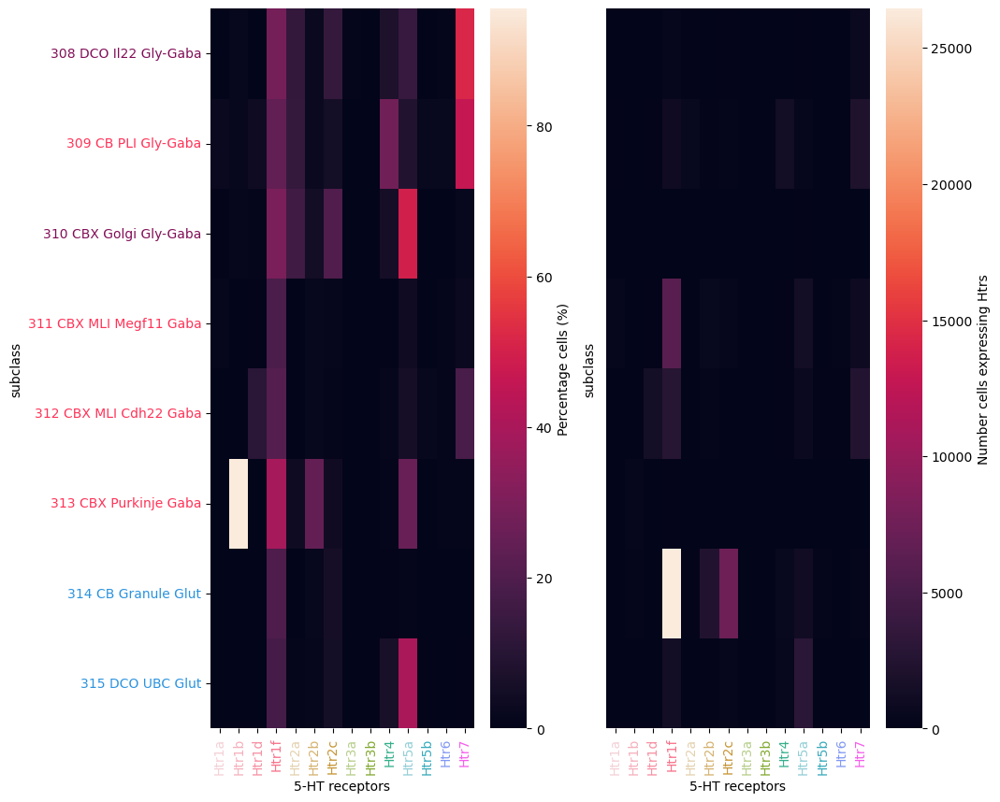

In [117]:
fig,axs = plt.subplots(1,2, figsize=(10,10))
sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum().div(sub_joined.groupby(group).size(), axis="index") * 100,
            yticklabels=True, cbar_kws={'label': 'Percentage cells (%)'}, ax=axs[0])
axs[0].set_xlabel("5-HT receptors")
for ytick in axs[0].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

sns.heatmap(sub_joined_boolean.groupby(group)[htrgenes].sum() ,
            yticklabels=False, cbar_kws={'label': 'Number cells expressing Htrs'}, ax=axs[1])
axs[1].set_xlabel("5-HT receptors")
for ytick in axs[1].get_xticklabels():
    ytick.set_color(htr_cmap_rgb[ytick.get_text()])

for ytick in axs[0].get_yticklabels():
    ytick.set_color(sub_joined[sub_joined["subclass"]==ytick.get_text()]['neurotransmitter_color'][0])
